Fit Baker et al. data with linear-nonlinear model with sigmoid transfer function, with no regularization

$$r = r_{min} + (r_{max} - r_{min})\left[\frac{\tanh\left(\beta (\mathbf{h}^T\mathbf{x} - z_0)]\right) + 1}{2}\right]$$

$$r = r_{min} + (r_{max} - r_{min})\left[\frac{\tanh\left(\beta (z - z_0)]\right) + 1}{2}\right]$$

Step 0: Fit linear filter only to stim period.

Step 1: Fit sigmoid params with linear filter fixed.

Step 2: Jointly optimize filter and sigmoid params.

In [1]:
%matplotlib inline
from copy import deepcopy as copy
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import optimize, signal, stats
from sklearn.linear_model import Ridge
import sys

from aux import make_dsn_mat
from disp import set_plot
from record_2_lin_ln import smlt_linr, smlt_lnr

cc = np.concatenate

FPS = 30.03
DT = 1/FPS

DUR_H = 10
IDUR_H = int(round(DUR_H/DT))

NNRN = 224
ALPHA = 0

FSAVE = 'data/simple/neur/baker_ln.npy'

In [2]:
# load data
DF_S = pd.read_csv('data/simple/neur/baker_resampled_s.csv')
DF_P = pd.read_csv('data/simple/neur/baker_resampled_p.csv')

I_S = np.array(DF_S['S'])
I_P = np.array(DF_P['P'])

R_SS = np.array(DF_S[[f'R_{cnrn}' for cnrn in range(NNRN)]])
R_PS = np.array(DF_P[[f'R_{cnrn}' for cnrn in range(NNRN)]])

T = np.arange(len(I_S))*DT

Step 0: Fit linear filters to during-stim epoch

In [3]:
# loop over expt_ids
h_s_0s = np.nan*np.zeros((IDUR_H, NNRN))
h_p_0s = np.nan*np.zeros((IDUR_H, NNRN))

# params giving approximately linear sigmoid
r_min_0s = -50*np.ones(NNRN)
r_max_0s = 50*np.ones(NNRN)
z_0_0s = np.zeros(NNRN)
beta_0s = 1/50*np.ones(NNRN)

r_0_ss = np.nan*R_SS
r_0_ps = np.nan*R_PS

for expt_id in range(NNRN):
    sys.stdout.write('.')
    r_s = R_SS[:, expt_id]
    r_p = R_PS[:, expt_id]
    
    mvalid_s = (~np.isnan(r_s)) & (T < 10)  # during-stim epoch
    mvalid_p = (~np.isnan(r_p)) & (T < 10)
    
    # fit model
    # build stim design matrix
    stim_mat_s = make_dsn_mat(I_S, IDUR_H)
    stim_mat_p = make_dsn_mat(I_P, IDUR_H)

    # get filter
    rgr_s = Ridge(alpha=ALPHA, fit_intercept=False).fit(stim_mat_s[mvalid_s, :], r_s[mvalid_s]/DT) 
    h_s = rgr_s.coef_[::-1]
    
    rgr_p = Ridge(alpha=ALPHA, fit_intercept=False).fit(stim_mat_p[mvalid_p, :], r_p[mvalid_p]/DT) 
    h_p = rgr_p.coef_[::-1]

    h_s_0s[:, expt_id] = h_s
    h_p_0s[:, expt_id] = h_p
    
params_0 = {
    'EXPT_ID': range(NNRN),
    'H_SS': h_s_0s, 'H_PS': h_p_0s,
    'R_MIN': r_min_0s, 'R_MAX': r_max_0s, 'Z_0': z_0_0s, 'BETA': beta_0s
}

................................................................................................................................................................................................................................

# Examine Step-0 fits

In [4]:
r_smln_s_0s = smlt_lnr(I_S, 0*I_P, params_0, DT)
r_smln_p_0s = smlt_lnr(0*I_S, I_P, params_0, DT)

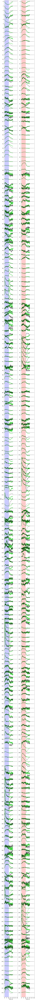

In [5]:
nplot = NNRN
t = np.arange(len(R_SS))*DT

fig, axs = plt.subplots(1, 2, figsize=(8, nplot), tight_layout=True)
y_ticks = []

for cexpt in range(nplot):
    y_tick = -4*cexpt
    
    ## sine response
    axs[0].axhline(y_tick, lw=1, ls='--', c='gray')
    axs[0].plot(t, R_SS[:, cexpt] + y_tick, c='limegreen', lw=3)  # true
    axs[0].plot(t, r_smln_s_0s[:, cexpt] + y_tick, c='k', lw=1)  # simulated 
    
    ## pulse response
    axs[1].axhline(y_tick, lw=1, ls='--', c='gray')
    axs[1].plot(t, R_PS[:, cexpt] + y_tick, c='limegreen', lw=3)
    axs[1].plot(t, r_smln_p_0s[:, cexpt] + y_tick, c='k', lw=1)  # simulated
    
    y_ticks.append(y_tick)
    
axs[0].axvspan(0, 10, color='b', alpha=.2)
axs[1].axvspan(0, 10, color='r', alpha=.2)

axs[0].set_ylabel('ROI')

for ax in axs:
    set_plot(ax, y_lim=(-4*NNRN, 1), y_ticks=y_ticks, y_tick_labels=range(NNRN), x_label='Time (s)', font_size=16)

Step 1: Fit nonlinearity while fixing filters

In [6]:
# fit sigmoid using scipy.optimize

## objective function
def obj_sgm(sgm_param, r_s, r_p, h_s_0, h_p_0):
    r_min, r_max, z_0, beta = sgm_param
    
    params_temp = {
        'H_SS': h_s_0[:, None], 'H_PS': h_p_0[:, None],
        'R_MIN': np.array([r_min]), 'R_MAX': np.array([r_max]),
        'Z_0': np.array([z_0]), 'BETA': np.array([beta]),
    }
    
    r_smln_s = smlt_lnr(I_S, 0*I_P, params_temp, DT)[:, 0]
    r_smln_p = smlt_lnr(0*I_S, I_P, params_temp, DT)[:, 0]

    mse = np.nanmean(cc([r_s-r_smln_s, r_p-r_smln_p])**2)
    return mse

## loop over neurons
r_min_1s = np.nan*r_min_0s
r_max_1s = np.nan*r_max_0s
z_0_1s = np.nan*z_0_0s
beta_1s = np.nan*beta_0s

for cnrn in range(NNRN):
    sys.stdout.write('.')
    r_s = R_SS[:, cnrn]
    r_p = R_PS[:, cnrn]
    h_s_0 = h_s_0s[:, cnrn]
    h_p_0 = h_p_0s[:, cnrn]
    
    # fit constraints
    r_bound = 3 * np.nanmax([np.abs(cc([r_s, r_p]))])
    bounds = [(-r_bound, r_bound), (-r_bound, r_bound), (None, None), (None, None)]
    
    np.random.seed(0)
    fit_rslt = optimize.minimize(
        obj_sgm,
        x0=[r_min_0s[cnrn], r_max_0s[cnrn], z_0_0s[cnrn], beta_0s[cnrn]],
        args=(r_s, r_p, h_s_0, h_p_0),
        bounds=bounds)
    
    r_min_1s[cnrn] = fit_rslt.x[0]
    r_max_1s[cnrn] = fit_rslt.x[1]
    z_0_1s[cnrn] = fit_rslt.x[2]
    beta_1s[cnrn] = fit_rslt.x[3]

................................................................................................................................................................................................................................

In [7]:
params_1 = {
    'EXPT_ID': range(NNRN),
    'H_SS': h_s_0s, 'H_PS': h_p_0s,
    'R_MIN': r_min_1s, 'R_MAX': r_max_1s, 'Z_0': z_0_1s, 'BETA': beta_1s
}

# Examine Step-1 fits

In [8]:
r_smln_s_1s = smlt_lnr(I_S, 0*I_P, params_1, DT)
r_smln_p_1s = smlt_lnr(0*I_S, I_P, params_1, DT)

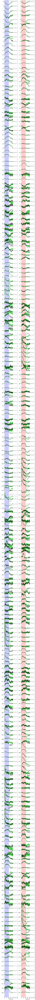

In [9]:
nplot = NNRN
t = np.arange(len(R_SS))*DT

fig, axs = plt.subplots(1, 2, figsize=(8, nplot), tight_layout=True)
y_ticks = []

for cexpt in range(nplot):
    y_tick = -4*cexpt
    
    ## sine response
    axs[0].axhline(y_tick, lw=1, ls='--', c='gray')
    axs[0].plot(t, R_SS[:, cexpt] + y_tick, c='limegreen', lw=3)  # true
    axs[0].plot(t, r_smln_s_0s[:, cexpt] + y_tick, c='k', ls='--', lw=1)  # step 0
    axs[0].plot(t, r_smln_s_1s[:, cexpt] + y_tick, c='k', lw=1)  # step 1
    
    ## pulse response
    axs[1].axhline(y_tick, lw=1, ls='--', c='gray')
    axs[1].plot(t, R_PS[:, cexpt] + y_tick, c='limegreen', lw=3)
    axs[1].plot(t, r_smln_p_0s[:, cexpt] + y_tick, c='k', ls='--', lw=1)  # step 0
    axs[1].plot(t, r_smln_p_1s[:, cexpt] + y_tick, c='k', lw=1)  # step 1
    
    y_ticks.append(y_tick)
    
axs[0].axvspan(0, 10, color='b', alpha=.2)
axs[1].axvspan(0, 10, color='r', alpha=.2)

axs[0].set_ylabel('ROI')

for ax in axs:
    set_plot(ax, y_lim=(-4*nplot, 1), y_ticks=y_ticks, y_tick_labels=range(nplot), x_label='Time (s)', font_size=16)

Step 2: Jointly optimize filter and sigmoid params

In [10]:
def obj_joint(param, r_s, r_p):
    r_min, r_max, z_0, beta = param[-4:]
    h_param = param[:-4]
    h_s = h_param[:len(h_param)//2]
    h_p = h_param[len(h_param)//2:]
    
    params_temp = {
        'H_SS': h_s[:, None], 'H_PS': h_p[:, None],
        'R_MIN': np.array([r_min]), 'R_MAX': np.array([r_max]),
        'Z_0': np.array([z_0]), 'BETA': np.array([beta]),
    }
    
    r_smln_s = smlt_lnr(I_S, 0*I_P, params_temp, DT)[:, 0]
    r_smln_p = smlt_lnr(0*I_S, I_P, params_temp, DT)[:, 0]

    mse = np.nanmean(cc([r_s-r_smln_s, r_p-r_smln_p])**2)
    return mse

## loop over neurons
h_s_2s = np.nan*h_s_0s
h_p_2s = np.nan*h_p_0s
r_min_2s = np.nan*r_min_0s
r_max_2s = np.nan*r_max_0s
z_0_2s = np.nan*z_0_0s
beta_2s = np.nan*beta_0s

for cnrn in range(NNRN):
    sys.stdout.write('.')
    r_s = R_SS[:, cnrn]
    r_p = R_PS[:, cnrn]
    h_s_0 = h_s_0s[:, cnrn]
    h_p_0 = h_p_0s[:, cnrn]
    
    x_0 = cc([h_s_0, h_p_0, [r_min_1s[cnrn], r_max_1s[cnrn], z_0_1s[cnrn], beta_1s[cnrn]]])
    
    # fit constraints
    r_bound = 3 * np.nanmax([np.abs(cc([r_s, r_p]))])
    bounds = [(-r_bound, r_bound), (-r_bound, r_bound), (None, None), (None, None)]
    bounds = ((len(h_s)+len(h_p))*[(None, None)] + bounds)
    
    np.random.seed(0)
    fit_rslt = optimize.minimize(
        obj_joint,
        x0=x_0,
        args=(r_s, r_p),
        bounds=bounds)
    
    h_s_2s[:, cnrn] = fit_rslt.x[:len(h_s_0)]
    h_p_2s[:, cnrn] = fit_rslt.x[len(h_p_0):-4]
    r_min_2s[cnrn] = fit_rslt.x[-4]
    r_max_2s[cnrn] = fit_rslt.x[-3]
    z_0_2s[cnrn] = fit_rslt.x[-2]
    beta_2s[cnrn] = fit_rslt.x[-1]

................................................................................................................................................................................................................................

In [11]:
params_2 = {
    'EXPT_ID': range(NNRN),
    'H_SS': h_s_2s, 'H_PS': h_p_2s,
    'R_MIN': r_min_2s, 'R_MAX': r_max_2s, 'Z_0': z_0_2s, 'BETA': beta_2s
}

# Examine Step-2 fits

In [12]:
r_smln_s_2s = smlt_lnr(I_S, 0*I_P, params_2, DT)
r_smln_p_2s = smlt_lnr(0*I_S, I_P, params_2, DT)

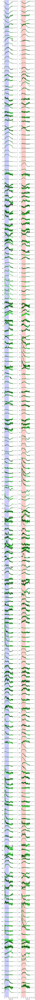

In [13]:
nplot = NNRN
t = np.arange(len(R_SS))*DT

fig, axs = plt.subplots(1, 2, figsize=(8, nplot), tight_layout=True)
y_ticks = []

for cexpt in range(nplot):
    y_tick = -4*cexpt
    
    ## sine response
    axs[0].axhline(y_tick, lw=1, ls='--', c='gray')
    axs[0].plot(t, R_SS[:, cexpt] + y_tick, c='limegreen', lw=3)  # true
    axs[0].plot(t, r_smln_s_1s[:, cexpt] + y_tick, c='k', ls='--', lw=1)  # step 1
    axs[0].plot(t, r_smln_s_2s[:, cexpt] + y_tick, c='k', lw=1)  # step 2
    
    ## pulse response
    axs[1].axhline(y_tick, lw=1, ls='--', c='gray')
    axs[1].plot(t, R_PS[:, cexpt] + y_tick, c='limegreen', lw=3)
    axs[1].plot(t, r_smln_p_1s[:, cexpt] + y_tick, c='k', ls='--', lw=1)  # step 1
    axs[1].plot(t, r_smln_p_2s[:, cexpt] + y_tick, c='k', lw=1)  # step 2
    
    y_ticks.append(y_tick)
    
axs[0].axvspan(0, 10, color='b', alpha=.2)
axs[1].axvspan(0, 10, color='r', alpha=.2)

axs[0].set_ylabel('ROI')

for ax in axs:
    set_plot(ax, y_lim=(-4*nplot, 1), y_ticks=y_ticks, y_tick_labels=range(nplot), x_label='Time (s)', font_size=16)

# Save params

In [14]:
np.save(FSAVE, np.array([params_2]))